In [68]:
import pandas as pd
import random
from PIL import Image

In [69]:
project_dir = 'C:/Users/neals/Desktop/practicum'
open_api_ships = pd.read_csv(f'{project_dir}/openai_results_ship.csv')
num_ship_images = len(open_api_ships[open_api_ships['prompt']=='Describe every item in the image'].index)
open_api_plane = pd.read_csv(f'{project_dir}/openai_results_plane.csv',index_col=0)
num_plane_images = len(open_api_plane[open_api_plane['prompt']=='Describe every item in the image'].index)
open_api_df = pd.concat([open_api_ships,open_api_plane])
context_df = open_api_df[open_api_df['prompt']=='Describe every item in the image']
total_num_images = len(context_df.index)
context_df.rename(columns={'reply': 'context'}, inplace=True)
print(len(open_api_df.index))

5769


C:\Users\neals\AppData\Local\Temp\ipykernel_28268\3949299819.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  context_df.rename(columns={'reply': 'context'}, inplace=True)


In [70]:
print(context_df.columns)
print(context_df['prompt'].unique())
for i, row in enumerate(context_df.itertuples()):
    print('\n--------------------------')
    print(f'index = {i}')
    print(row.context)
    print('\n--------------------------')
    if i >= 5 : break

Index(['prompt', 'context', 'time', 'img_id', 'img_path', 'image_id'], dtype='object')
['Describe every item in the image']

--------------------------
index = 0
The image appears to be an aerial view of a residential area with various items visible. Here's a description of each item seen in the image:

1. **Houses**: There are two houses visible, one with a gray roof and another with a brown roof.
2. **Boat**: A small boat is docked on the water near a pier.
3. **Pier**: A small pier extends into the water, with a blue and white structure at the end.
4. **Garden or Flower Bed**: There is a colorful area that looks like a garden or flower bed near the house with the gray roof.
5. **Trees and Shrubs**: Various trees and shrubs are scattered throughout the yard areas, providing greenery and shade.
6. **Lawn Areas**: There are open grassy areas around the houses.
7. **Driveway**: A driveway is visible leading up to the house with the brown roof.
8. **Outdoor Structures**: There is a small

In [71]:
def search_images_by_keywords(df, keywords):
    query = ' & '.join([f'context.str.contains("{kw}", case=False)' for kw in keywords])
    print(query)
    return df.query(query)

def search_images_by_keyword_sets(df, keyword_sets):
    # For each set of keywords, create an AND condition
    conditions = [' & '.join([f'context.str.contains("{kw}", case=False)' for kw in keywords]) for keywords in keyword_sets]
    
    # Join these conditions with OR logic between sets
    query = ' | '.join([f'({cond})' for cond in conditions])
    
    # Use the query to filter the dataframe
    return df.query(query)

context.str.contains("ship", case=False) & context.str.contains("military", case=False)
10
reduced search from total:2431 to 10 | 99.59% reduction
reduced search from ship images:909 to 10 | 98.90% reduction
reduced search from plane images:1522 to 10 | 99.34% reduction


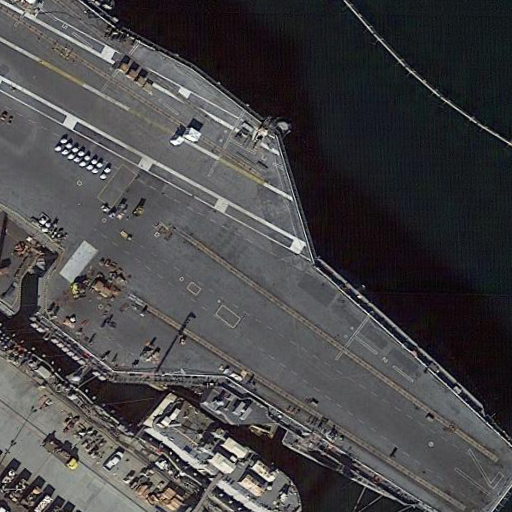

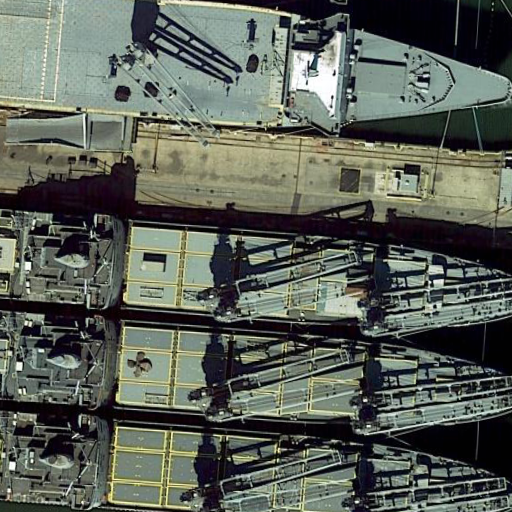

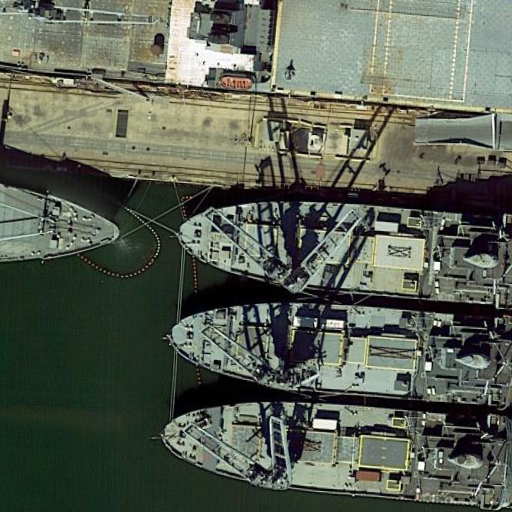

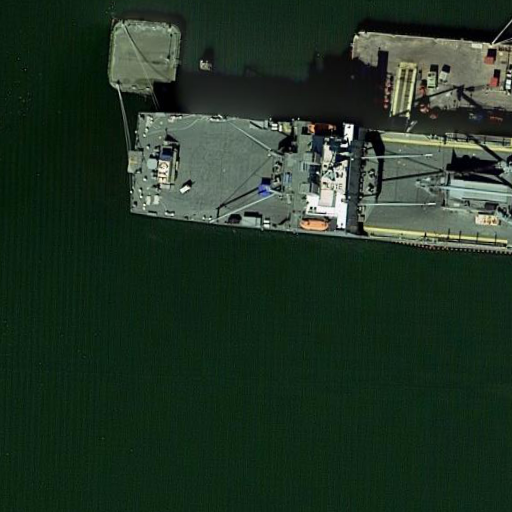

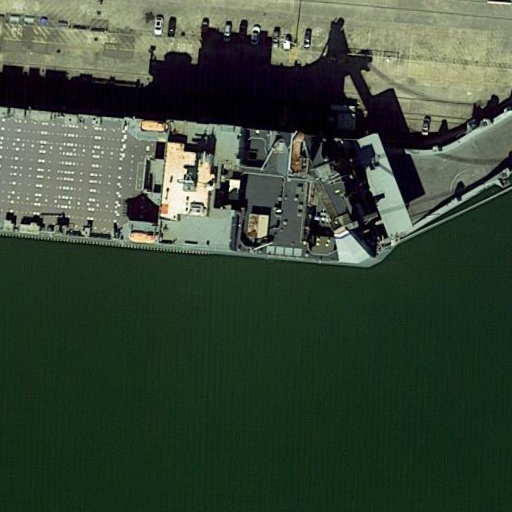

In [72]:
# Search for images with both "boat" and "backyard"
#keywords = ['boat', 'trees']
#keywords = ['boat', 'backyard']
#keywords = ['plane', 'boat']
keywords = ['plane', 'military']
keywords = ['boat', 'military']
keywords = ['boat', 'war']
keywords = ['boat', 'road']
keywords = ['ship', 'military']
result = search_images_by_keywords(context_df, keywords)

result_images = list(result['img_path'].unique())

print(len(result_images))
print(f'reduced search from total:{total_num_images} to {len(result_images)} | {100*(total_num_images-len(result_images))/total_num_images:.2f}% reduction')
print(f'reduced search from ship images:{num_ship_images} to {len(result_images)} | {100*(num_ship_images-len(result_images))/num_ship_images:.2f}% reduction')
print(f'reduced search from plane images:{num_plane_images} to {len(result_images)} | {100*(num_plane_images-len(result_images))/num_plane_images:.2f}% reduction')
sample_images = random.sample(result_images,min(5,len(result_images)))

for img_path in sample_images:
    display(Image.open(img_path))


14
reduced search from total:2431 to 14 | 99.42% reduction
reduced search from ship images:909 to 14 | 98.46% reduction
reduced search from plane images:1522 to 14 | 99.08% reduction
The image shows an aerial view of a naval dockyard with several key elements:

1. **Aircraft Carrier**: Dominating the image is a large aircraft carrier docked at the pier. It features a flat flight deck with visible markings for aircraft operations. The carrier has a superstructure (island) on the starboard side, which houses the ship's command center and flight control towers.

2. **Warships**: To the left of the aircraft carrier, there are two smaller naval ships moored. These appear to be destroyers or frigates, characterized by their streamlined hulls and deck structures.

3. **Dockside Cranes**: Along the pier, there are multiple cranes likely used for loading and unloading supplies and equipment. These cranes are tall and slender.

4. **Support Vehicles**: There are several vehicles visible on the p

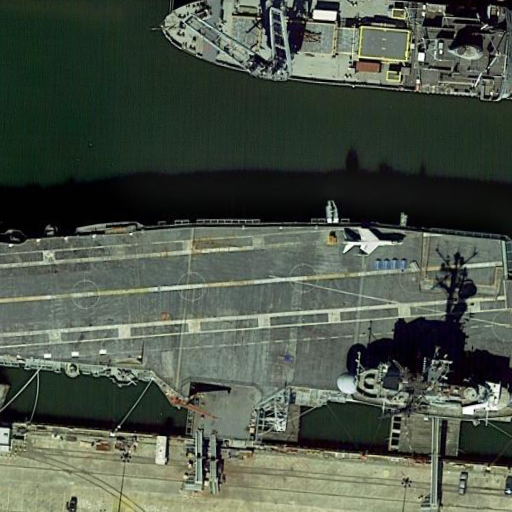

The image shows an aerial view of a dock area with various elements:

1. **Ship**: There is a large ship docked at the pier. It appears to be a military or naval vessel, given its gray color and structured design.

2. **Pier**: The ship is moored to a concrete pier, which has several visible features such as mooring bollards and safety barriers.

3. **Smaller Boats**: There are two smaller boats visible. One is docked alongside the pier near the larger ship, and another is located in a separate docking area to the left.

4. **Docking Area for Smaller Boats**: To the left of the main ship, there is a separate docking area that includes a smaller, possibly floating dock.

5. **Storage Containers**: There are multiple storage containers on the pier, arranged in stacks. These are typically used for transporting or storing goods and equipment.

6. **Crane**: There is a crane on the pier, likely used for loading and unloading heavy items from ships.

7. **Vehicles**: Several vehicles are par

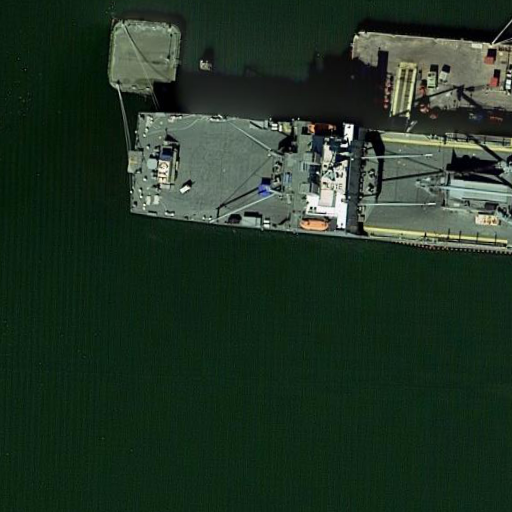

The image you've uploaded is an aerial view of an aircraft carrier. Here are the items visible in the image:

1. **Aircraft**: There are several aircraft visible on the deck of the carrier. These include jet fighters, identifiable by their sleek, aerodynamic shapes and wing configurations.

2. **Flight Deck**: The large, flat surface used for the launching and recovery of aircraft. It has various markings and lines that guide operations.

3. **Island**: The superstructure on the starboard side of the flight deck. It houses the bridge and serves as the command center for flight-deck operations.

4. **Antennas and Radars**: Mounted on the island, these are used for navigation, communication, and aircraft control.

5. **Elevators**: There are platforms used to move aircraft between the flight deck and the hangar deck. One can be seen on the right side of the image.

6. **Safety Nets**: Around the edges of the flight deck, these nets are designed to prevent personnel and equipment from fal

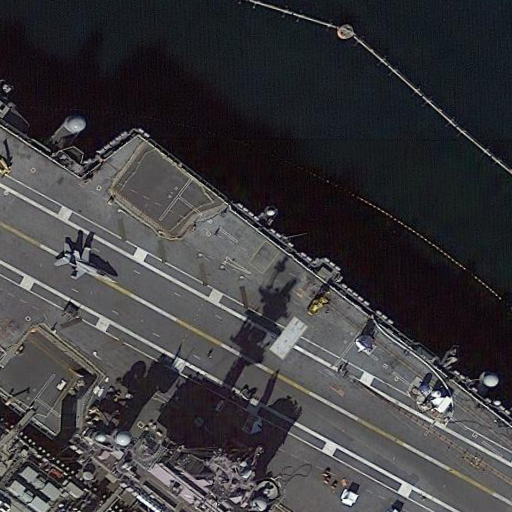

The image shows an aerial view of a naval dockyard with various elements visible:

1. **Aircraft Carrier**: Dominating the image is a large aircraft carrier docked at the pier. It features a flat flight deck with visible markings and parked aircraft.

2. **Warship**: Beside the aircraft carrier, there is a smaller naval warship docked. It has a grey hull and superstructure typical of military vessels.

3. **Dockyard Infrastructure**: The dockyard includes multiple buildings, likely used for administrative purposes and possibly for storage and maintenance related to naval operations.

4. **Vehicles**: There are several vehicles visible, including cars and cargo handling equipment scattered around the dockyard area.

5. **Cranes and Cargo Containers**: Several cranes are visible, which are used for loading and unloading supplies and equipment. Nearby, there are stacks of cargo containers, likely containing supplies for naval operations or ship maintenance.

6. **Pier**: The pier extends 

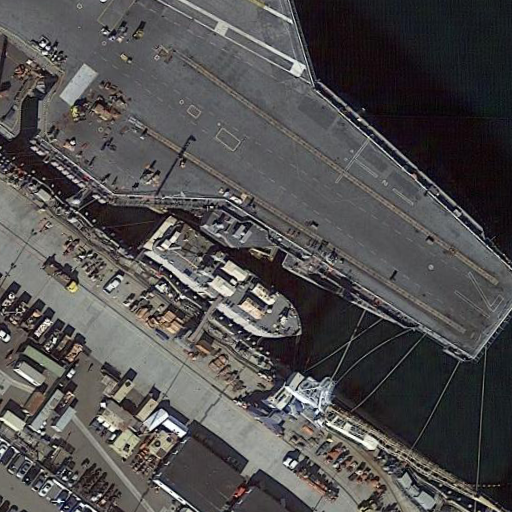

The image shows an aerial view of an aircraft carrier docked at a pier. Here are the items visible in the image:

1. **Aircraft Carrier**: The main structure in the image is a large aircraft carrier, identifiable by its flat and expansive flight deck used for launching and recovering aircraft. The deck features several markings and appears to be clear of any aircraft.

2. **Pier**: Adjacent to the aircraft carrier is a pier, which supports various structures and vehicles. The pier is connected to the mainland and provides the necessary infrastructure for the carrier's docking and logistical needs.

3. **Vehicles**: There are several vehicles visible on the pier. These are likely used for transport and logistical support for the aircraft carrier.

4. **Crane**: Near the rear of the aircraft carrier, there is a crane, possibly used for loading and unloading heavy equipment or supplies.

5. **Mooring Lines**: Several thick lines (ropes or cables) can be seen extending from the aircraft ca

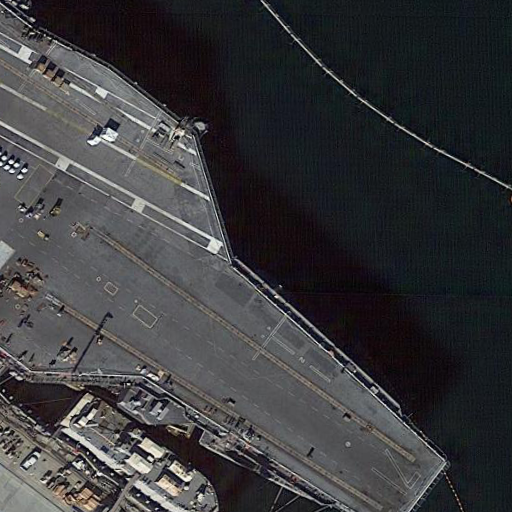

In [78]:
# Search for images with both "boat" and "backyard"
keyword_sets =[ ['boat', 'military'],
                ['ship', 'military'],
                ['boat', 'flight deck'],
                ['ship', 'flight deck']]

result = search_images_by_keyword_sets(context_df, keyword_sets)

result_images = list(result['img_path'].unique())

print(len(result_images))
print(f'reduced search from total:{total_num_images} to {len(result_images)} | {100*(total_num_images-len(result_images))/total_num_images:.2f}% reduction')
print(f'reduced search from ship images:{num_ship_images} to {len(result_images)} | {100*(num_ship_images-len(result_images))/num_ship_images:.2f}% reduction')
print(f'reduced search from plane images:{num_plane_images} to {len(result_images)} | {100*(num_plane_images-len(result_images))/num_plane_images:.2f}% reduction')
sample_images =result.sample(n=min(5,len(result_images)))

for row in sample_images.itertuples():
    print(row.context)
    display(Image.open(row.img_path))

253
reduced search from total:2431 to 253 | 89.59% reduction
reduced search from ship images:909 to 253 | 72.17% reduction
reduced search from plane images:1522 to 253 | 83.38% reduction
The image shows an aerial view of multiple military transport aircraft parked on a tarmac. Each aircraft has a similar design, featuring a high-wing structure, four turboprop engines, and a tail ramp for loading and unloading cargo. The aircraft are arranged in a grid-like pattern on the tarmac, which appears to be made of concrete with visible wear and tire marks. Additionally, there are some small, indistinct objects scattered around the aircraft, possibly equipment or cargo pallets. The overall scene suggests a military or cargo airfield.


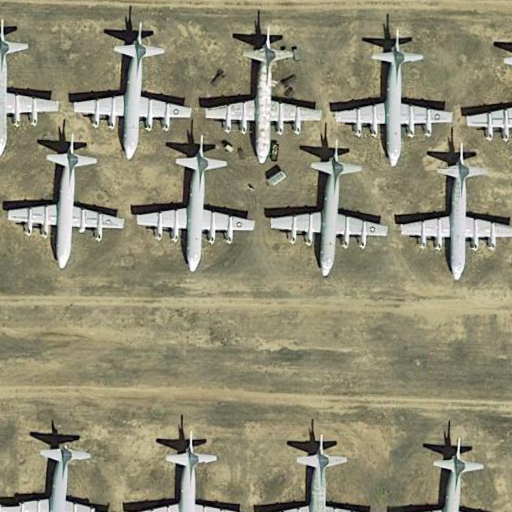

The image shows an aerial view of an area that appears to be part of an airfield or airport. Here are the items visible in the image:

1. **Runway/Taxiway**: There is a prominent paved area that looks like a runway or taxiway used for the movement of aircraft.

2. **Aircraft**: There are two aircraft visible:
   - One aircraft is on the left side of the image, featuring a green and brown camouflage pattern, possibly a military plane.
   - Another aircraft is on the right side, predominantly white with blue and red markings, resembling a commercial or cargo plane.

3. **Vehicles**: There are several small vehicles visible on the runway/taxiway. These could be service vehicles or airport operational vehicles.

4. **Dirt Tracks**: Surrounding the paved area are multiple dirt tracks, indicating frequent vehicle movement around the area.

5. **Grassy and Barren Land**: The surrounding land is patchy with areas of grass and barren spots, typical of airfield surroundings that are not heavily 

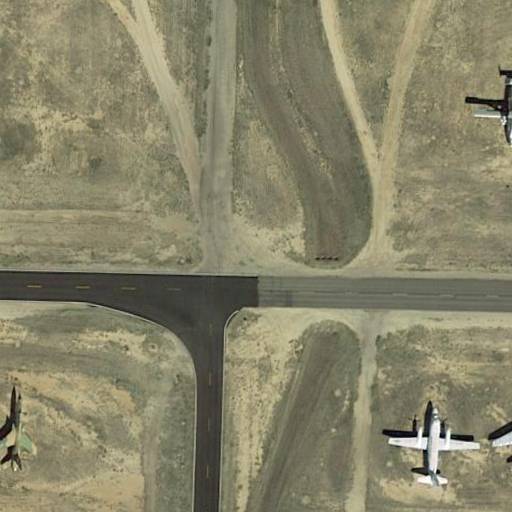

The image shows an aerial view of a large military aircraft on a ground surface that appears to be a runway or an airfield. Here are the items visible in the image:

1. **Military Aircraft**: The aircraft is large, with a distinct gray color and features characteristic of a military transport or refueling plane. It has a high-wing design, which is typical for aircraft that need to perform well at low speeds or in rugged conditions. The tail is equipped with a vertical stabilizer and horizontal stabilizers.

2. **Jet Engines**: There are four jet engines attached under the wings, two on each side. These engines are large and likely provide significant thrust, suitable for heavy lifting and long-range missions.

3. **Landing Gear**: The landing gear is visible beneath the aircraft, indicating that the plane is either preparing for takeoff, landing, or is parked.

4. **Shadow**: The shadow of the aircraft is visible on the ground, indicating the position of the sun and giving a 3D perspec

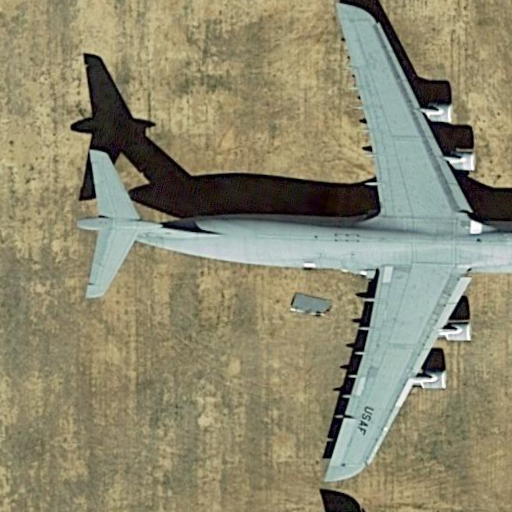

The image shows an aerial view of an area with several aircraft displayed on the ground, likely at an air museum or an outdoor exhibition. Here's a detailed description of each visible item:

1. **Aircraft on the Top Left**: This is a large, four-engine jet aircraft, painted in a gray and white camouflage pattern. It appears to be a military cargo or transport plane.

2. **Aircraft on the Top Center**: This aircraft is smaller, with a sleek, streamlined design and two engines mounted on the rear part of the fuselage. It is painted white with blue and red markings, suggesting it might be used for either display or aerobatic purposes.

3. **Aircraft on the Top Right**: This is a single-engine, propeller-driven aircraft with a distinctive black and white paint scheme and a large number "75" on the side. It has a long, pointed nose and a single tail, typical of vintage or historical military aircraft.

4. **Aircraft on the Bottom Left**: Similar to the top left aircraft, this is another la

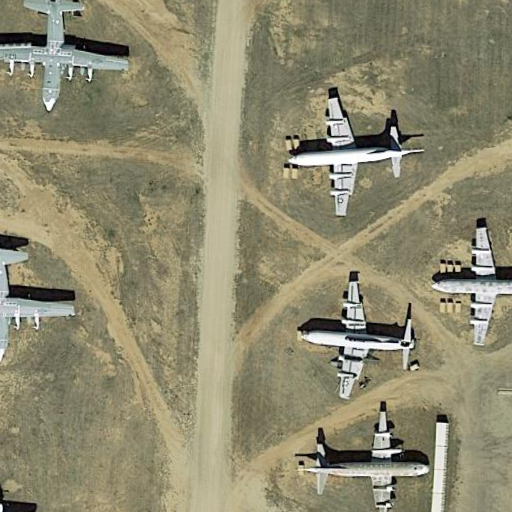

The image shows an aerial view of a landscape with several distinct elements:

1. **Aircraft**: There are five large aircraft visible, parked in a row. Each aircraft has a distinctive blue and gray color scheme. They appear to be military transport planes, characterized by their large size, high wings, and rear loading ramps.

2. **Ground Surface**: The area is largely barren with patches of dry, sandy soil. There are several parallel tracks or marks on the ground, possibly from vehicles or machinery, which run vertically in the image.

3. **Road**: There is a dirt road running horizontally across the image at the bottom. The road appears to be compact and smoother than the surrounding terrain.

This setting suggests a military or remote airfield used for the storage or deployment of aircraft. The environment is arid, indicating a desert or similarly dry geographical location.


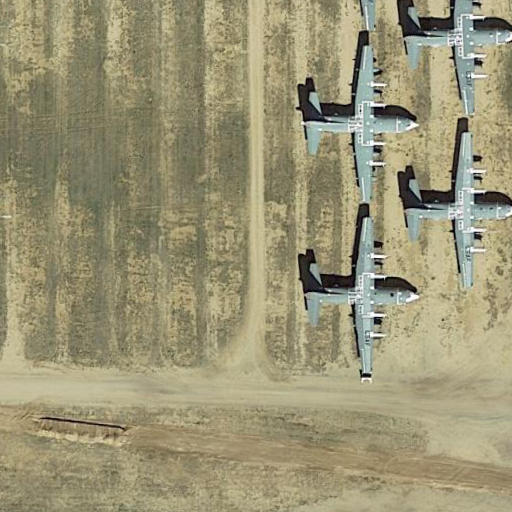

In [80]:
keyword_sets =[ ['plane', 'military'],
                ['craft', 'military']]

result = search_images_by_keyword_sets(context_df, keyword_sets)

result_images = list(result['img_path'].unique())

print(len(result_images))
print(f'reduced search from total:{total_num_images} to {len(result_images)} | {100*(total_num_images-len(result_images))/total_num_images:.2f}% reduction')
print(f'reduced search from ship images:{num_ship_images} to {len(result_images)} | {100*(num_ship_images-len(result_images))/num_ship_images:.2f}% reduction')
print(f'reduced search from plane images:{num_plane_images} to {len(result_images)} | {100*(num_plane_images-len(result_images))/num_plane_images:.2f}% reduction')
sample_images =result.sample(n=min(5,len(result_images)))

for row in sample_images.itertuples():
    print(row.context)
    display(Image.open(row.img_path))

30
reduced search from total:2431 to 30 | 98.77% reduction
reduced search from ship images:909 to 30 | 96.70% reduction
reduced search from plane images:1522 to 30 | 98.03% reduction
The image shows an aerial view of a waterfront area with various items visible:

1. **Buildings**: There are several buildings, mostly residential homes with different roof styles and colors. Some have flat roofs, while others have sloped, tiled roofs.

2. **Boats**: Multiple boats are docked along the waterfront. These range in size and type, including larger yachts and smaller motorboats.

3. **Swimming Pool**: One of the buildings has a rectangular, blue swimming pool in its backyard.

4. **Patios and Decks**: Several of the homes have patios or decks, some equipped with outdoor furniture.

5. **Trees and Vegetation**: There are trees and other greenery visible in the yards of some homes, providing shade and aesthetic enhancement.

6. **Docks**: There are docks extending into the water from the properti

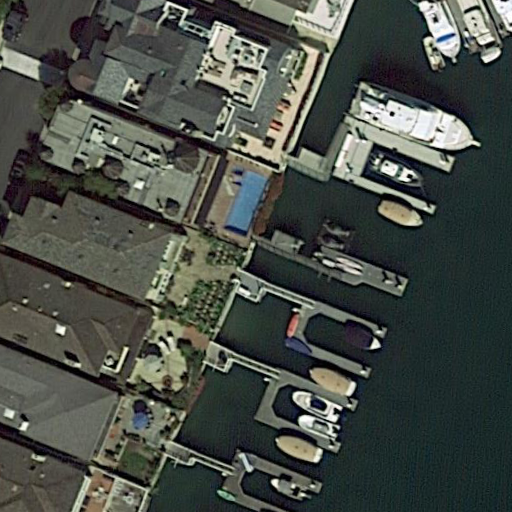

The image shows an aerial view of a residential area with waterfront properties. Here are the items visible in the image:

1. **Houses**: There are several houses with different roof colors and designs. Some roofs are dark, possibly indicating solar panels, while others are lighter. The houses vary in size and layout, some with visible backyards.

2. **Vehicles**: There are a few vehicles parked along the street and in driveways. These include a white van and a couple of cars.

3. **Boats**: Along the waterfront, there are several boats moored next to the houses. These range from larger yachts to smaller boats.

4. **Docks**: Each waterfront house has a dock extending into the water, used for mooring the boats.

5. **Trees**: There are palm trees visible in the yards of some houses, adding greenery to the residential area.

6. **Swimming Pools**: At least one house has a visible swimming pool in the backyard.

7. **Streets**: A street runs horizontally through the image, with vehicles 

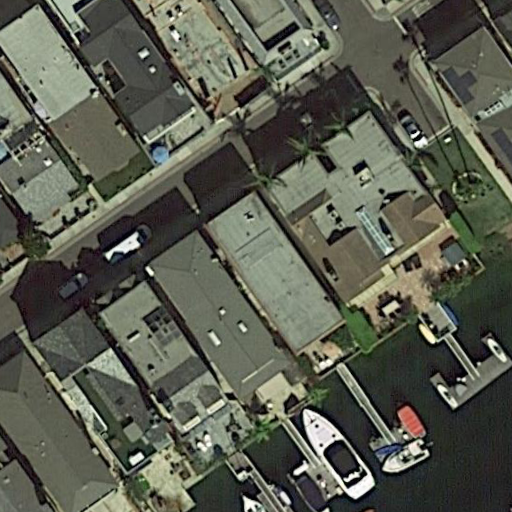

The image shows an aerial view of a property by a body of water. Here are the items visible in the image:

1. **Body of Water**: There is a large body of water adjacent to the property, likely a lake or river.
2. **Residential Building**: A large house with a gray roof is situated near the water's edge.
3. **Smaller Building**: Next to the main house, there is a smaller building with a similar roofing style.
4. **Swimming Pool**: There is a swimming pool in the backyard of the main house, with a blue interior.
5. **Dock**: A small dock or pier extends into the water, with a boat moored to it.
6. **Trees**: The property is surrounded by dense trees, providing privacy and greenery.
7. **Driveway**: A driveway is visible leading up to the buildings, partially obscured by trees.
8. **Boat**: There is a small boat moored at the dock.

These elements together create a serene and private lakeside residential setting.


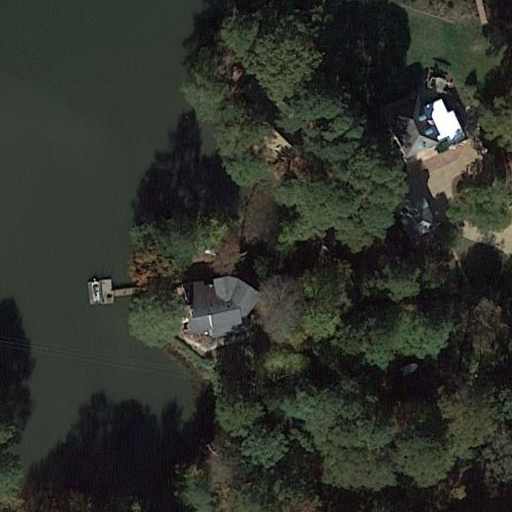

The image shows an aerial view of a residential area with various features:

1. **Houses**: There are several houses visible, each with distinct roofing. Some roofs are gray, others are brown, and a few have a reddish tint. The houses vary in size and shape, indicating a mix of architectural styles.

2. **Roads**: Two roads intersect in the image, dividing the area into blocks. The roads appear to be typical for residential areas, with no visible lane markings.

3. **Vehicles**: There are multiple vehicles parked along the sides of the roads. There is a white van, a white car, and several other cars of various colors including red and blue.

4. **Driveways**: Several houses have driveways leading up to garages, visible as darker patches on the properties.

5. **Backyards**: Some of the houses have visible backyards with various landscaping elements. One backyard has a large round structure that could be a trampoline or a pool cover.

6. **Trees and Vegetation**: There are trees scatter

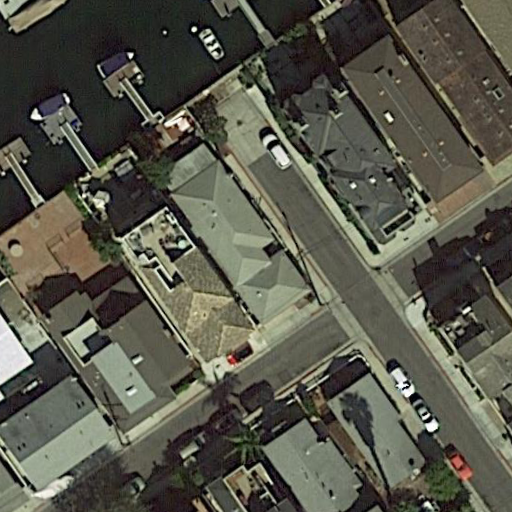

The image you've provided is an aerial view of a waterfront residential area. Here are the items visible in the image:

1. **Houses**: There are several houses with terracotta-colored roofs. The architecture appears to be Mediterranean or Spanish style, common in coastal regions.

2. **Swimming Pools**: At least two of the houses have swimming pools in their backyards. One is rectangular, and the other is a more irregular shape.

3. **Boats**: There are two boats docked at private docks extending into the waterway. One boat is larger than the other.

4. **Docks**: There are several docks visible, extending from the backyards of the houses into the waterway. They vary in length and configuration.

5. **Palm Trees**: Several palm trees are scattered throughout the properties, providing a tropical landscape aesthetic.

6. **Vehicles**: There is a white car parked on the street adjacent to one of the houses.

7. **Waterway**: A clear, blue-green waterway runs along the back of the properti

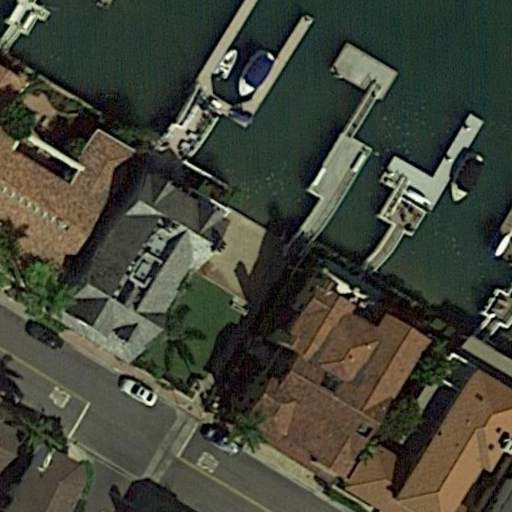

In [79]:
keyword_sets =[ ['boat', 'backyard', 'tree'],
                ['ship', 'backyard', 'tree'],
                ]

result = search_images_by_keyword_sets(context_df, keyword_sets)

result_images = list(result['img_path'].unique())

print(len(result_images))
print(f'reduced search from total:{total_num_images} to {len(result_images)} | {100*(total_num_images-len(result_images))/total_num_images:.2f}% reduction')
print(f'reduced search from ship images:{num_ship_images} to {len(result_images)} | {100*(num_ship_images-len(result_images))/num_ship_images:.2f}% reduction')
print(f'reduced search from plane images:{num_plane_images} to {len(result_images)} | {100*(num_plane_images-len(result_images))/num_plane_images:.2f}% reduction')
sample_images =result.sample(n=min(5,len(result_images)))

for row in sample_images.itertuples():
    print(row.context)
    display(Image.open(row.img_path))